<a href="https://colab.research.google.com/github/NehaKumari500092077/Visual-Computing/blob/main/OpenCV_Basics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tutorial 2: Working With Images Using OpenCV

## Image Processing with OpenCV (Python API)

### What is OpenCV and why is it used?

OpenCV (Open Source Computer Vision Library) is an open-source computer vision and machine learning software library. It contains more than 2500 optimized algorithms for various computer vision tasks. It is widely used for image processing, video capture, and analysis, including facial recognition, object detection, and tracking.


In [ ]:
# Import necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Utility function to display images
def display_image(image, cmap_type='gray'):
    image_new = cv2.resize(image, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_NEAREST)
    cv2_imshow(image_new)

def display_image_plt(image, cmap_type='gray'):
    if len(image.shape) == 3: # Color image
        cmap_type = None
    image_new = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_new, cmap=cmap_type)
    plt.show()

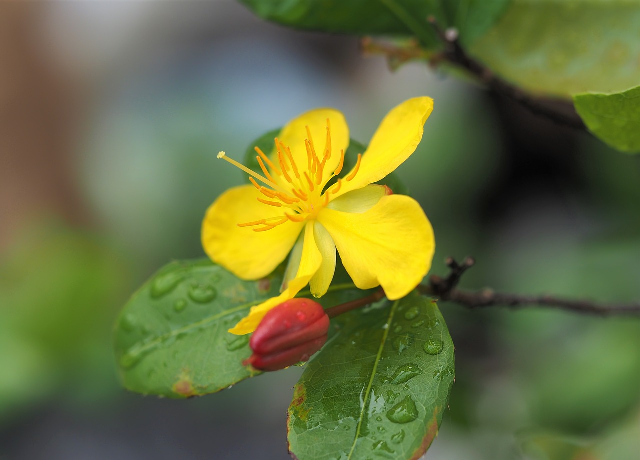

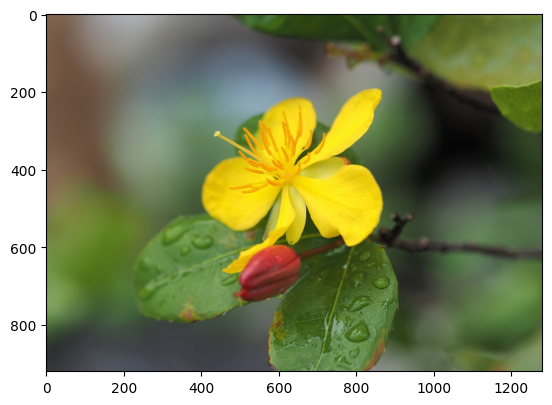

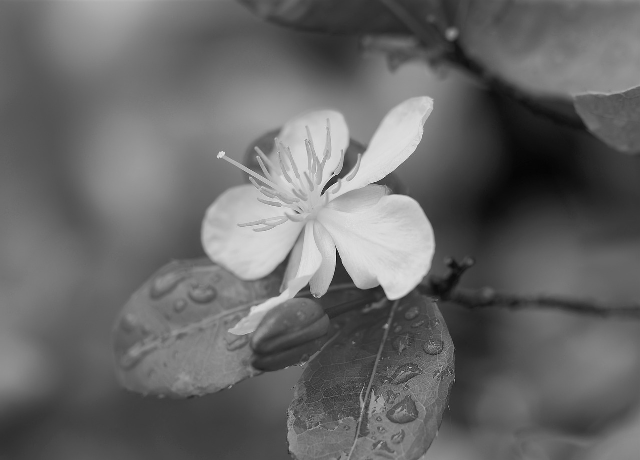

In [ ]:
### Reading and displaying images
# Reading a color image
color_image = cv2.imread('visual_computing_tutorial_2.jpg')
display_image(color_image)
display_image_plt(color_image)

# Reading a grayscale image
gray_image = cv2.imread('visual_computing_tutorial_2.jpg', cv2.IMREAD_GRAYSCALE)
display_image(gray_image)

### Colorspaces and order of color channels: RGB vs BGR

In OpenCV, the default color space is BGR (Blue-Green-Red), which is different from the RGB (Red-Green-Blue) order commonly used in other libraries like matplotlib.


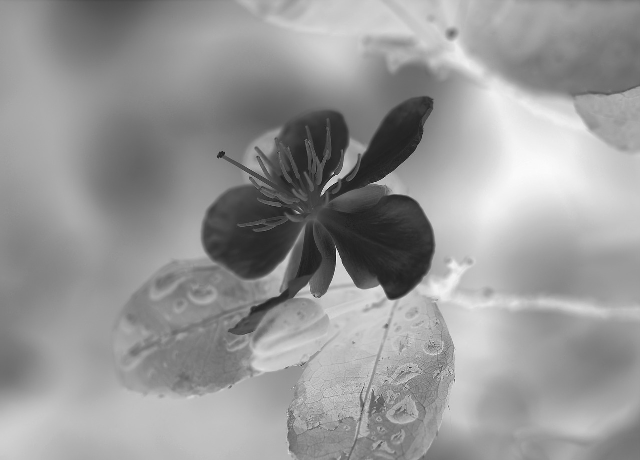

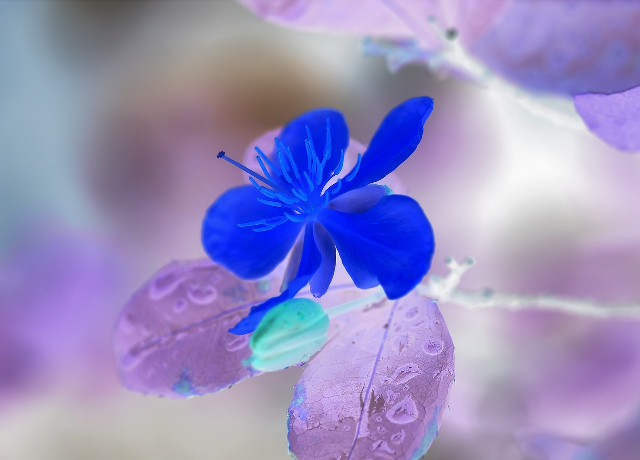

In [ ]:
### Generating the negative of an image (in grayscale and color)
# Negative of a grayscale image
negative_gray = 255 - gray_image
display_image(negative_gray)

# Negative of a color image
negative_color = 255 - color_image
display_image(negative_color)


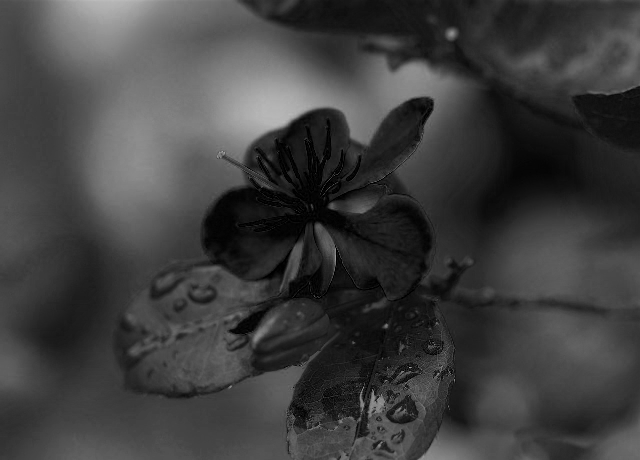

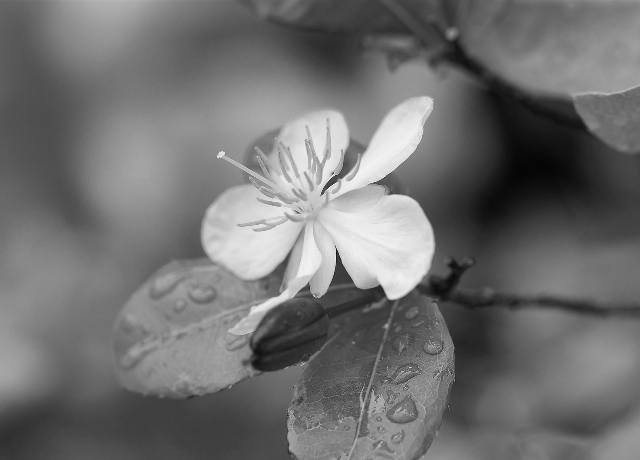

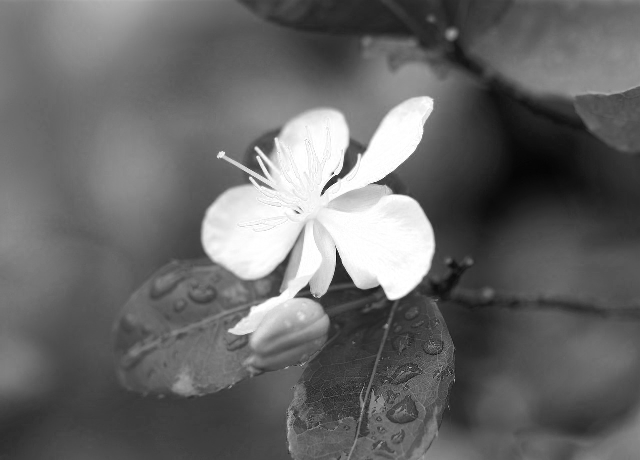

In [ ]:
### Displaying the color channels of an image in the RGB space
# Splitting the channels
blue_channel, green_channel, red_channel = cv2.split(color_image)

# Displaying each channel
display_image(blue_channel)
display_image(green_channel)
display_image(red_channel)

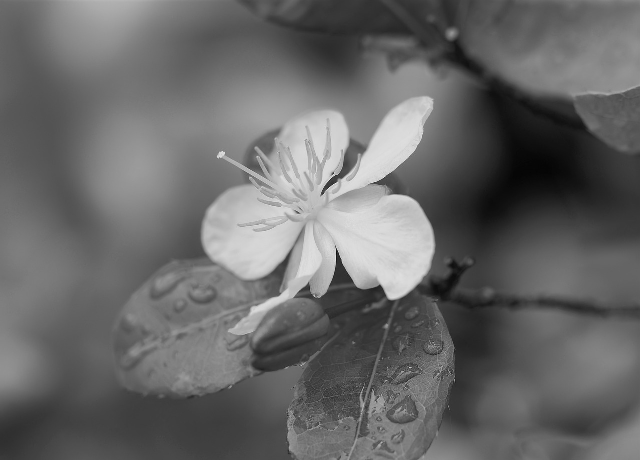

In [ ]:
### Color space conversions with examples
# RGB to Grayscale
gray_image_converted = cv2.cvtColor(color_image, cv2.COLOR_BGR2GRAY)
display_image(gray_image_converted)

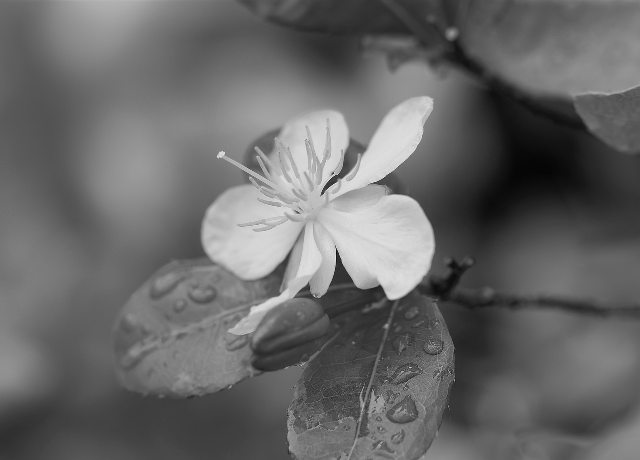

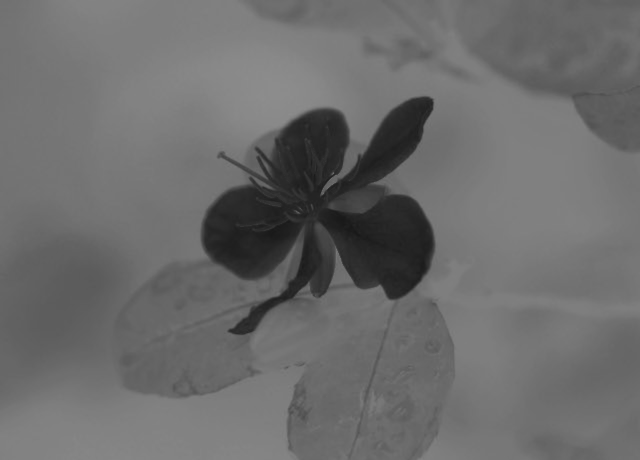

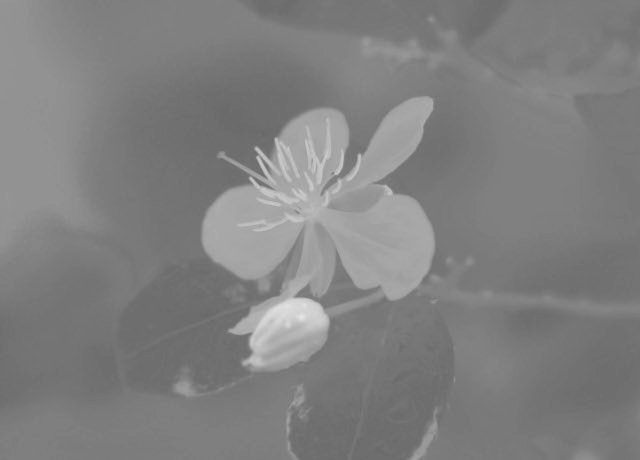

In [ ]:
# RGB to YUV
yuv_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2YUV)
y_channel, u_channel, v_channel = cv2.split(yuv_image)
display_image(y_channel)
display_image(u_channel)
display_image(v_channel)

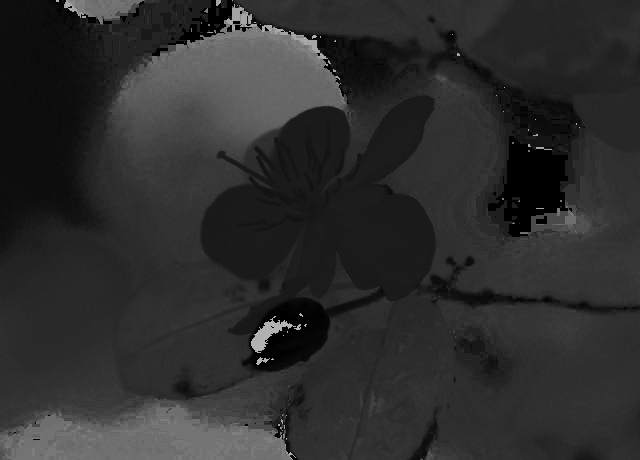

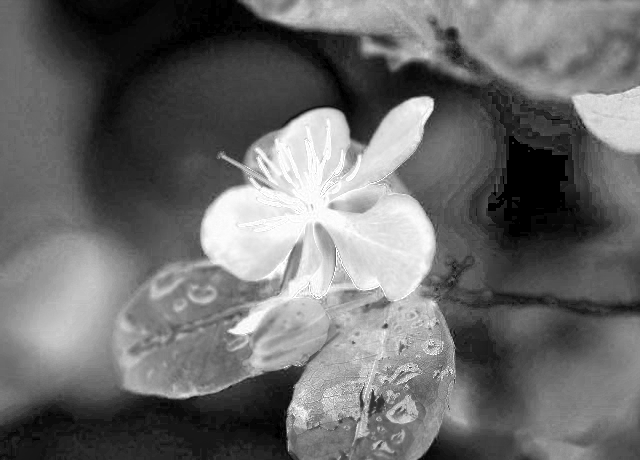

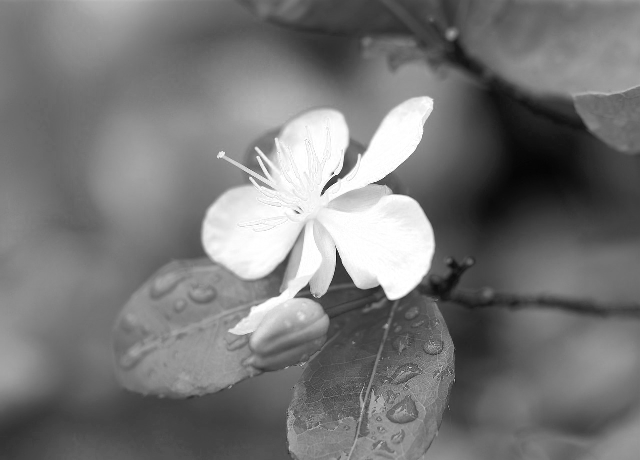

In [ ]:
# RGB to HSV
hsv_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2HSV)
h_channel, s_channel, v_channel_hsv = cv2.split(hsv_image)
display_image(h_channel)
display_image(s_channel)
display_image(v_channel_hsv)

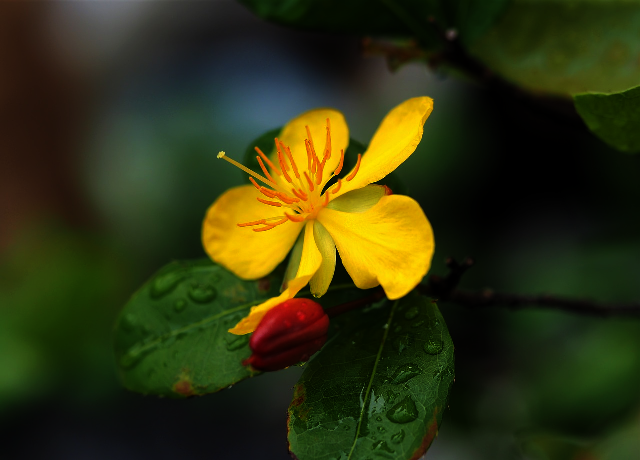

In [ ]:
### Adjusting the brightness and contrast of images (power law transformations)
gamma = 2.2
adjusted = np.array(255*(color_image / 255) ** gamma, dtype = 'uint8')
display_image(adjusted, cv2.COLOR_BGR2RGB)

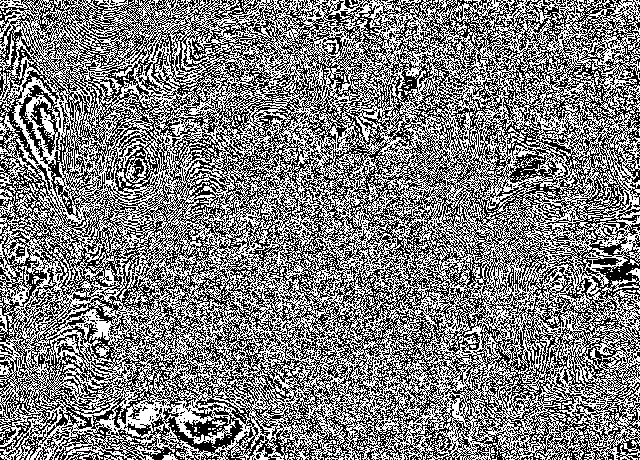

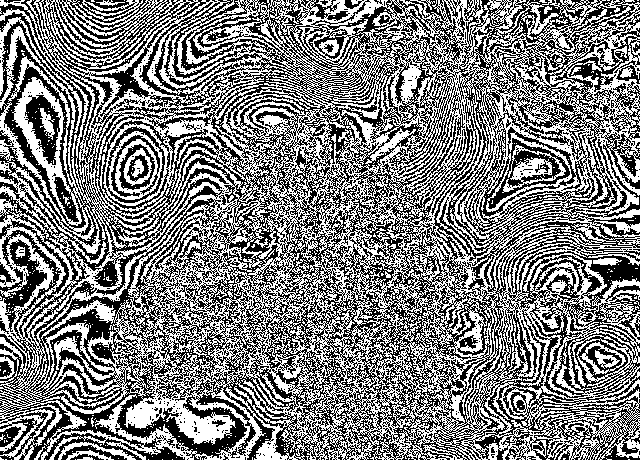

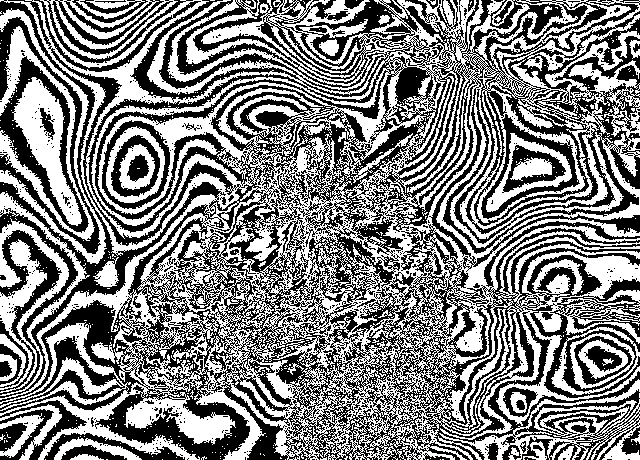

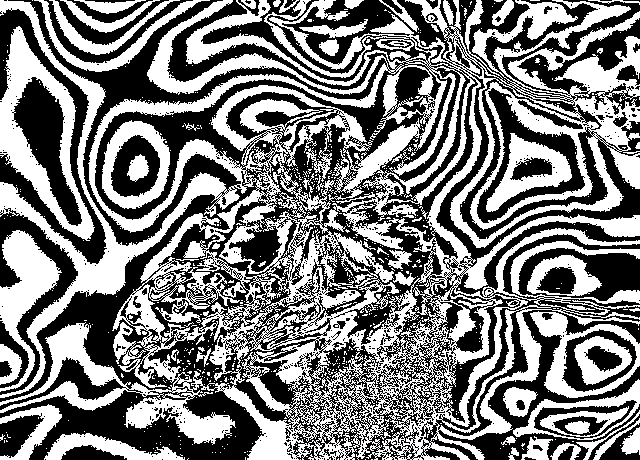

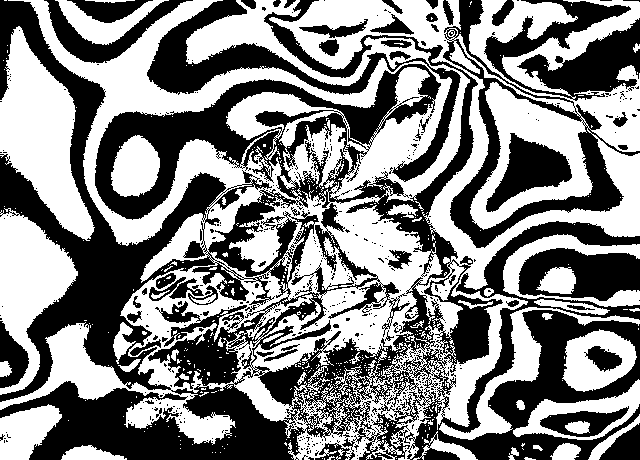

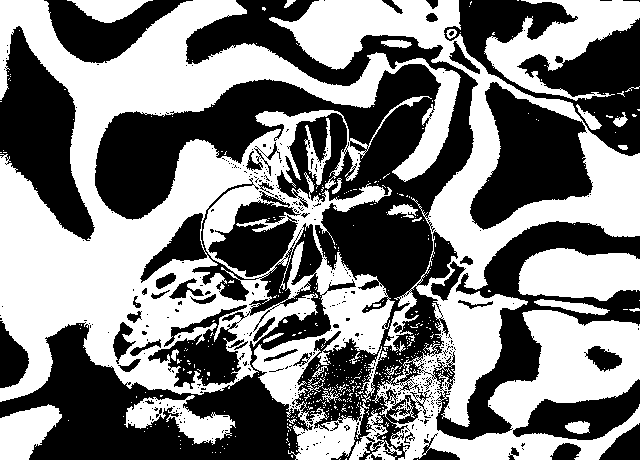

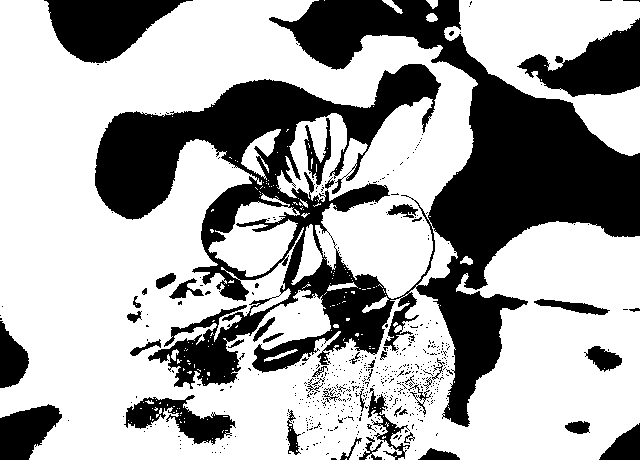

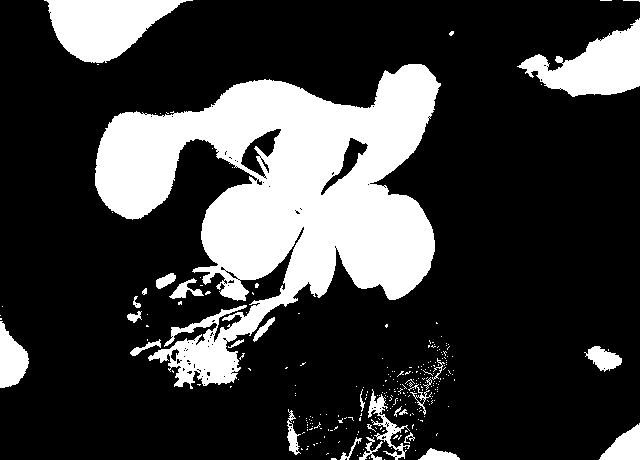

In [ ]:
### Bit plane slicing – extracting and displaying individual bit planes of images
def bit_plane_slicing(image, bit_plane):
    rows, cols = image.shape
    bit_plane_image = np.zeros((rows, cols), dtype=np.uint8)
    for i in range(rows):
        for j in range(cols):
            bit_plane_image[i, j] = (image[i, j] & (1 << bit_plane)) >> bit_plane
    return bit_plane_image

bit_planes = [bit_plane_slicing(gray_image, i) for i in range(8)]
for i, bp in enumerate(bit_planes):
    display_image(bp * 255.0)

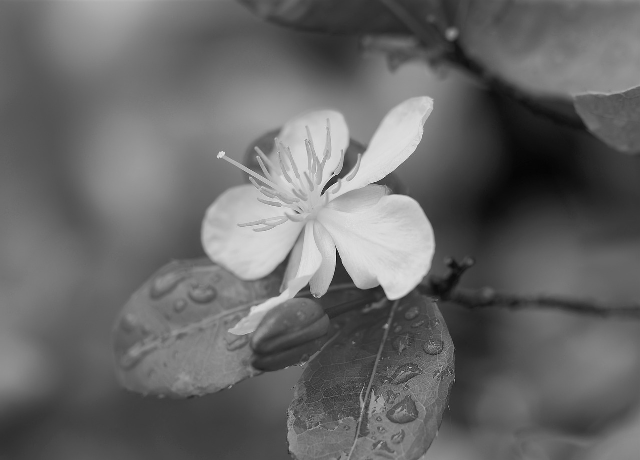

In [ ]:
reconstructed_image = [bit_planes[i] << i for i in range(8)]
reconstructed_image = np.sum(np.array(reconstructed_image, dtype=np.uint8), axis=0, dtype=np.uint8)
display_image(reconstructed_image)

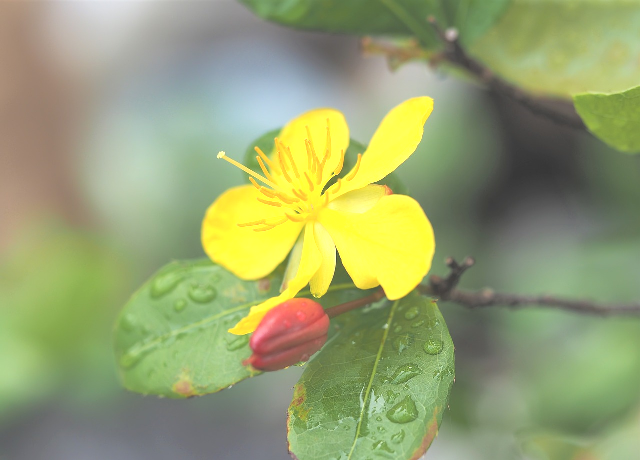

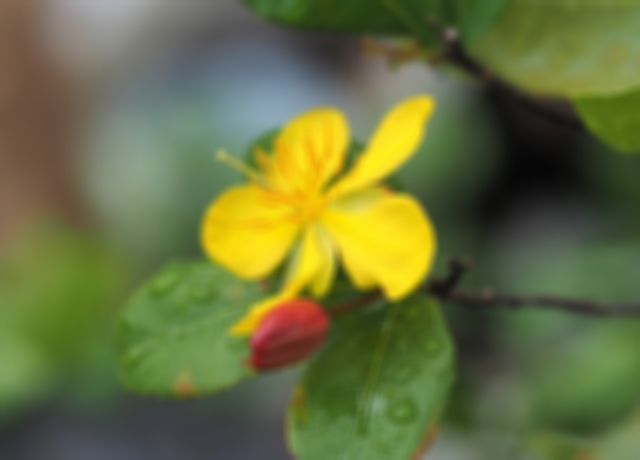

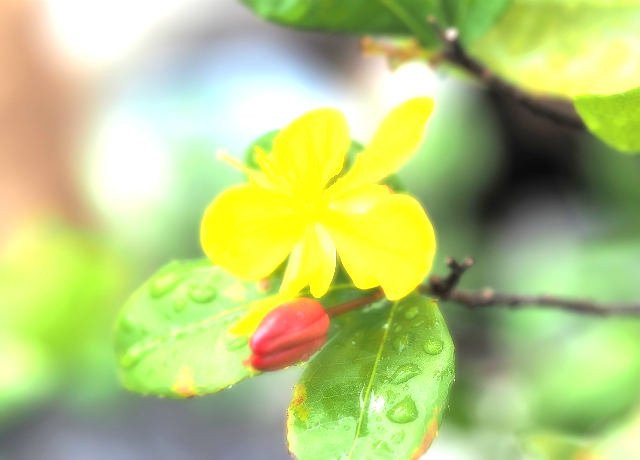

In [ ]:
### Pixelwise operation on images – addition, subtraction, multiplication, division
# Example: Addition of scalar value
brightened_image = cv2.add(color_image, np.array([50.0, 50.0, 50.0]))
display_image(brightened_image)

# Example: Addition of two images
blurred_image = cv2.blur(color_image, (21, 21))
display_image(blurred_image)
bloom_image = cv2.add(color_image, blurred_image)
display_image(bloom_image)

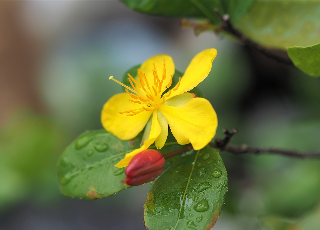

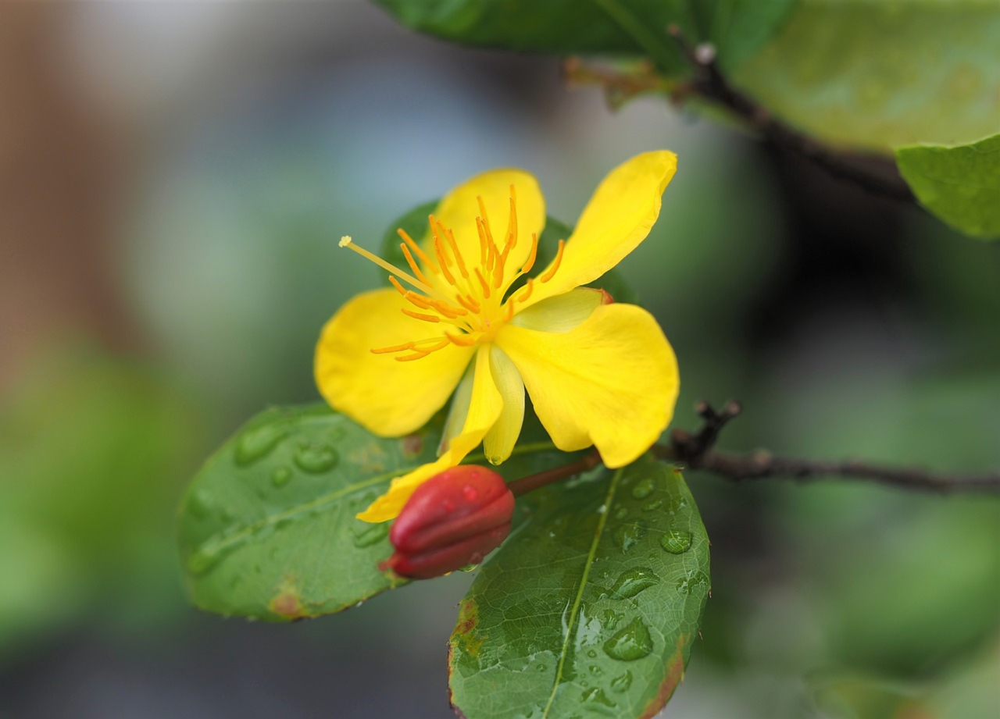

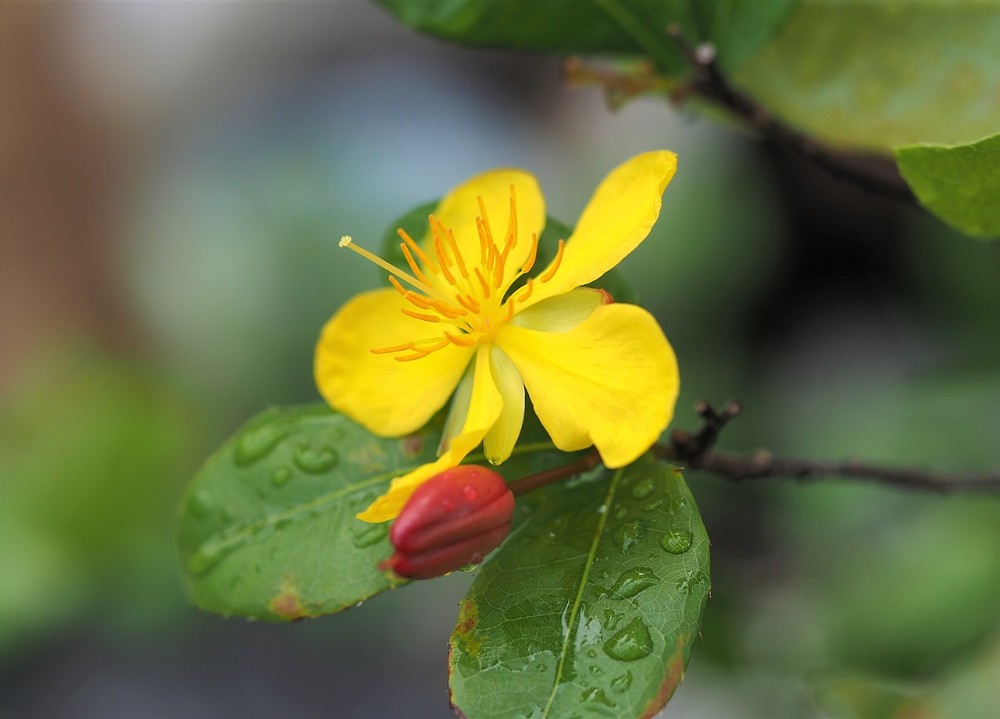

In [ ]:
### Resizing images – downsampling and upsampling images
# Nearest neighbor interpolation
resized_image_nn = cv2.resize(color_image, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_NEAREST)
display_image(resized_image_nn)

# Bilinear interpolation
resized_image_bl = cv2.resize(color_image, None, fx=2, fy=2, interpolation=cv2.INTER_LINEAR)
display_image(resized_image_bl)

# Bicubic interpolation
resized_image_bc = cv2.resize(color_image, None, fx=4, fy=4, interpolation=cv2.INTER_CUBIC)
display_image(resized_image_bc)


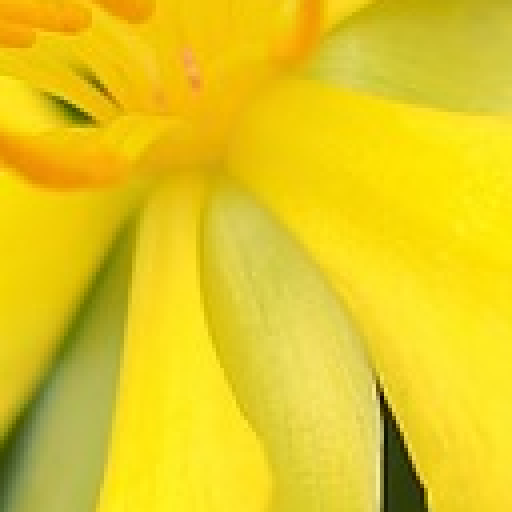

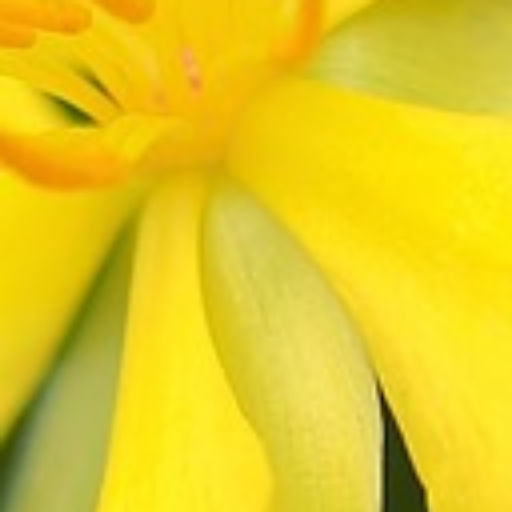

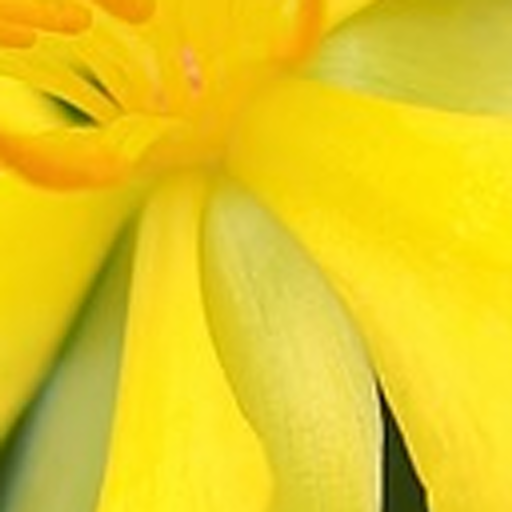

In [ ]:
w = 128
h = 128
center = color_image.shape
x = int((center[1] / 2) - (w/2))
y = int((center[0] / 2) - (h/2))

cropped_image = color_image[y:y+h, x:x+w]

# Nearest neighbor interpolation
resized_image_nn = cv2.resize(cropped_image, None, fx=8, fy=8, interpolation=cv2.INTER_NEAREST)
display_image(resized_image_nn)

# Bilinear interpolation
resized_image_bl = cv2.resize(cropped_image, None, fx=8, fy=8, interpolation=cv2.INTER_LINEAR)
display_image(resized_image_bl)

# Bicubic interpolation
resized_image_bc = cv2.resize(cropped_image, None, fx=8, fy=8, interpolation=cv2.INTER_CUBIC)
display_image(resized_image_bc)

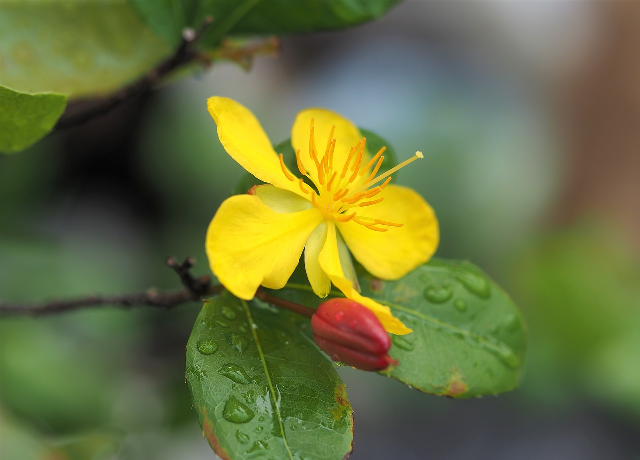

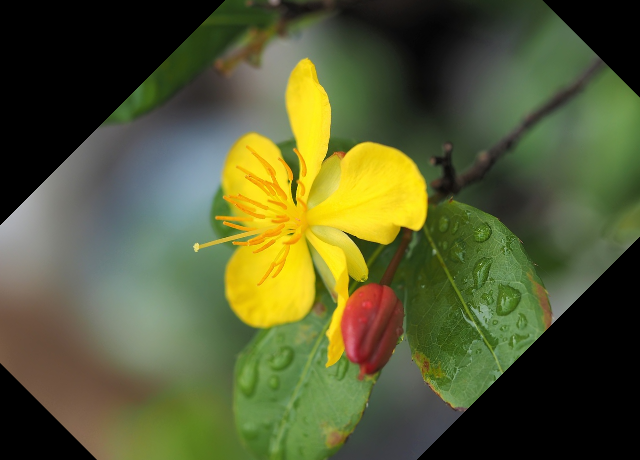

In [ ]:
### Flipping and rotating images
# Flipping
flipped_image = cv2.flip(color_image, 1)
display_image(flipped_image)

# Rotating
(h, w) = color_image.shape[:2]
center = (w // 2, h // 2)
matrix = cv2.getRotationMatrix2D(center, 45, 1.0)
rotated_image = cv2.warpAffine(color_image, matrix, (w, h))
display_image(rotated_image)


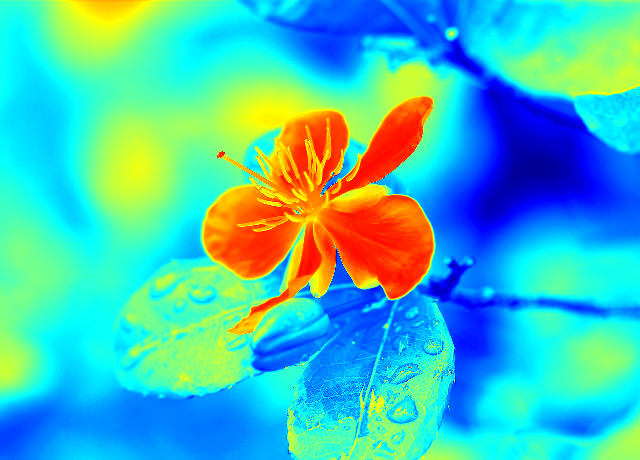

In [ ]:
### Colormaps and their use
colormap_image = cv2.applyColorMap(gray_image, cv2.COLORMAP_JET)
display_image(colormap_image)

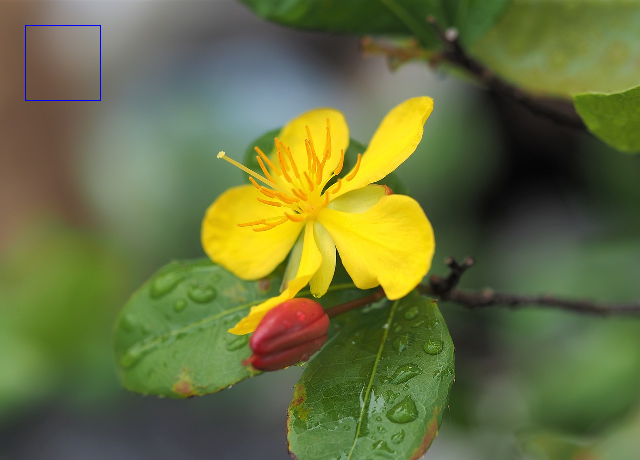

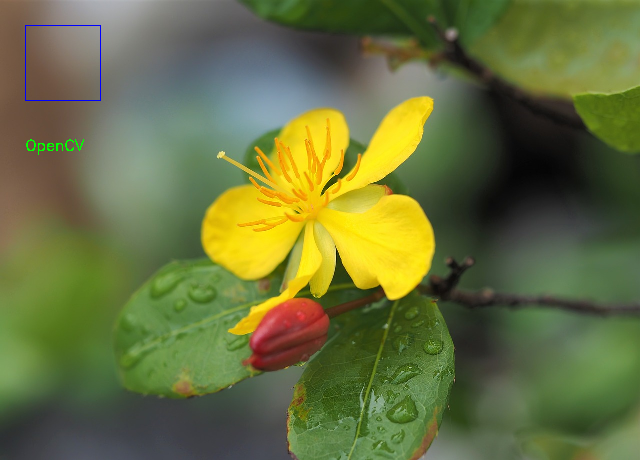

In [ ]:
### Annotating an image – drawing shapes and overlaying text
# Drawing a rectangle
annotated_image = color_image.copy()
cv2.rectangle(annotated_image, (50, 50), (200, 200), (255, 0, 0), 2)
display_image(annotated_image)

# Overlaying text
cv2.putText(annotated_image, 'OpenCV', (50, 300), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)
display_image(annotated_image)


## Other image processing libraries

### Scikit-image

Scikit-image is a collection of algorithms for image processing. It is part of the SciPy ecosystem and is designed to interoperate with NumPy and other libraries in the SciPy stack. It is known for its easy-to-use interface and wide range of algorithms.


### Pillow

Pillow is a fork of the Python Imaging Library (PIL). It adds support for opening, manipulating, and saving many different image file formats. It is known for its simplicity and ease of use.


### When to use each library

- OpenCV: Best for real-time computer vision applications, extensive functionality for image and video processing, optimized for performance.
- Scikit-image: Ideal for scientific image analysis, offers a wide range of algorithms and easy integration with other SciPy stack libraries.
- Pillow: Great for basic image manipulation, supports many image file formats, simple and easy to use.

